<a href="https://colab.research.google.com/github/20jyotiraditya04/Automatic-Image-Cationing/blob/main/team_id_11_a_b_c.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## 📦 Environment Setup for NLP and Vision Tasks

This section installs and sets up the necessary packages for running NLP and Vision tasks, including evaluation metrics, transformer models, and datasets.

### 🔧 Install Required Libraries

In [ ]:
!pip install evaluate
!pip install -U nltk
!pip install rouge-score
!pip install transformers datasets torchvision torch accelerate

import nltk
nltk.download('wordnet')
nltk.download('omw-1.4')

[nltk_data] Downloading package wordnet to /usr/share/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /usr/share/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


True

## 📂 DatasetLoader Class

The `DatasetLoader` class is designed to load image-caption pairs from a structured custom dataset directory.

In [ ]:
# CLASS FOR LOADING DATA
import os
import pandas as pd

class DatasetLoader:
    def __init__(self,data_type:str,limit: int = None):

        if data_type not in ['train','test','val']:
            raise ValueError("data type should be train/test/val")

        self.root_dir = '/kaggle/input/dl-dataset/custom_captions_dataset'
        self.data_type = data_type
        self.limit = limit

        self.image_dir = os.path.join(self.root_dir,self.data_type)
        self.csv_file = os.path.join(self.root_dir,self.data_type + ".csv")

        if not os.path.exists(self.image_dir):
            raise FileNotFoundError(f"Image directory {self.image_dir} not loaded")
        if not os.path.exists(self.csv_file):
            raise FileNotFoundError(f"CSV file {self.csv_file} not loaded")

        df = pd.read_csv(self.csv_file)

        if self.limit is not None:
            df = df.iloc[:self.limit]

        self.data = []
        for ind,row in df.iterrows():
            img_path = os.path.join(self.image_dir,row["filename"])

            if not os.path.exists(img_path):
                print(f"Image {img_path} does not exists")
                continue

            self.data.append((img_path,str(row["caption"]) ))

    def get_data(self):
        return self.data


## 🧠 Zero-Shot Image Captioning with SmolVLM

This code performs **zero-shot image captioning** using the [SmolVLM-256M-Instruct](https://huggingface.co/HuggingFaceTB/SmolVLM-256M-Instruct) model from Hugging Face.

---

### 📦 Model and Processor Initialization

In [ ]:
from transformers import AutoProcessor,AutoModelForVision2Seq
import torch

num_of_images = None
Test_Data_Loader = DatasetLoader("test",num_of_images)
Test_Data = Test_Data_Loader.get_data()

DEVICE = "cuda:0" if torch.cuda.is_available() else "cpu"

SmolVLM_MODEL = "HuggingFaceTB/SmolVLM-256M-Instruct"

Processor = AutoProcessor.from_pretrained(SmolVLM_MODEL)
Model = AutoModelForVision2Seq.from_pretrained(
    SmolVLM_MODEL,
    torch_dtype=torch.bfloat16,
    _attn_implementation="eager",
).to(DEVICE)

def zero_shot_captioning(image_path,model_name = SmolVLM_MODEL):
    image = Image.open(image_path).convert("RGB")
    messages = [{
        "role": "user",
        "content": [
            {"type": "image"},
            {"type": "text", "text": "Describe the image in less than 100 words in the form of a caption with some key details of the objects in image"}

        ]
    }]

    # Prepare inputs
    prompt = Processor.apply_chat_template(messages, add_generation_prompt=True)
    inputs = Processor(text=prompt, images=image, return_tensors="pt")
    inputs = {k: v.to(DEVICE) for k, v in inputs.items()}
    # Generate outputs
    generated_ids = Model.generate(
        **inputs,
        max_new_tokens=100,                             # restrict captions to 100 words long
        eos_token_id=Processor.tokenizer.eos_token_id)  # End at stopping point

    generated_texts = Processor.batch_decode(
        generated_ids,
        skip_special_tokens=True,
    )

    caption_generated = generated_texts[0].split("Assistant:")[-1].strip()

    return caption_generated


processor_config.json:   0%|          | 0.00/68.0 [00:00<?, ?B/s]

chat_template.json:   0%|          | 0.00/429 [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/486 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/28.2k [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/801k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/466k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/3.55M [00:00<?, ?B/s]

added_tokens.json:   0%|          | 0.00/4.74k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/1.07k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/7.35k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/513M [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/136 [00:00<?, ?B/s]

## 🖼️ Caption Generation and Visualization

This section loops through the test dataset and performs caption generation using the `zero_shot_captioning` function.

---

### 🔄 Iterating Over Test Data

Image: /kaggle/input/dl-dataset/custom_captions_dataset/test/test_1.jpg


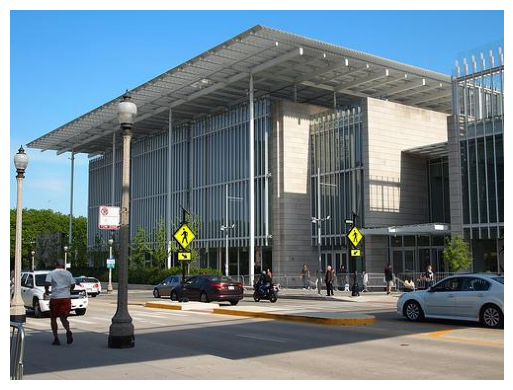


Reference_Caption: A large building with bars on the windows in front of it. There is people walking in front of the building. There is a street in front of the building with many cars on it. 

Generated_Caption: In the image we can see a building with a roof and walls. There are many people standing on the sidewalk. There are many vehicles on the road. There are many poles and lights. There are many trees and plants. There is a board with text on it.
-------------------------------------------------
Image: /kaggle/input/dl-dataset/custom_captions_dataset/test/test_2.jpg


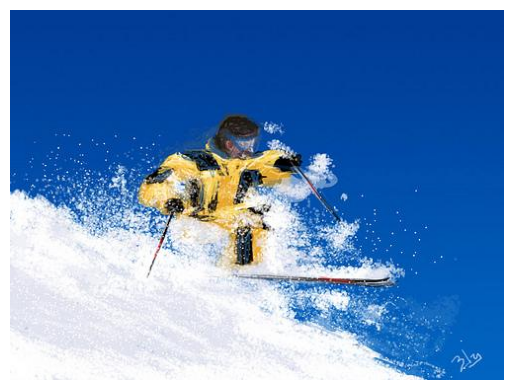


Reference_Caption: A person is skiing through the snow. There is loose snow all around them from him jumping. The person is wearing a yellow snow suit. The person is holding two ski poles in their hands. 

Generated_Caption: In this image, we can see a person wearing a jacket and holding a ski pole. We can also see the sky, water, and some other objects.
-------------------------------------------------
Image: /kaggle/input/dl-dataset/custom_captions_dataset/test/test_3.jpg


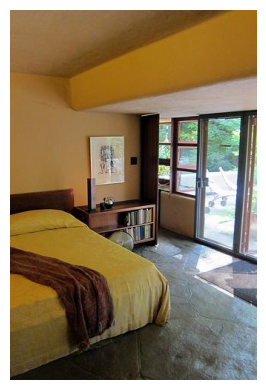


Reference_Caption: There is a bed in a room against a wall. There is a brown blanket on top of the bed. There is a small brown book shelf next to the bed. There is a picture hanging on the wall above the shelf. 

Generated_Caption: The image shows a cozy and well-organized bedroom with a focus on a bed. The bed is positioned in the center of the room, with a large bed frame that is visible on the left side of the image. The bed has a yellow bedspread and a brown blanket draped over the head of the bed. The bed is made up with a yellow blanket and a brown blanket, which adds a warm and cozy feel to the room.

The room has a tiled floor,
-------------------------------------------------
Image: /kaggle/input/dl-dataset/custom_captions_dataset/test/test_4.jpg


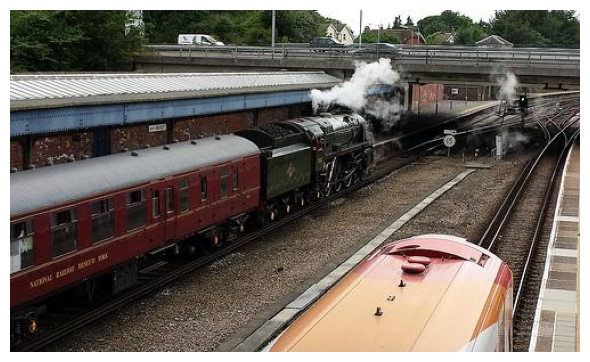


Reference_Caption: A black and red train is on the tracks and has steam coming out off of it. There is another train next to the first train that is orange. There is an overpass over the train tracks with cars on it. 

Generated_Caption: In this image, we can see trains on the railway tracks. We can also see smoke, a vehicle, a car, a train, a bridge, trees, a building, a vehicle, a pole, a vehicle, a car, a train track, a bridge, a building, a vehicle, a person, a tree, a building, a vehicle, a person, a bridge, a building, a vehicle, a person, a tree, a building, a vehicle, a person,
-------------------------------------------------
Image: /kaggle/input/dl-dataset/custom_captions_dataset/test/test_5.jpg


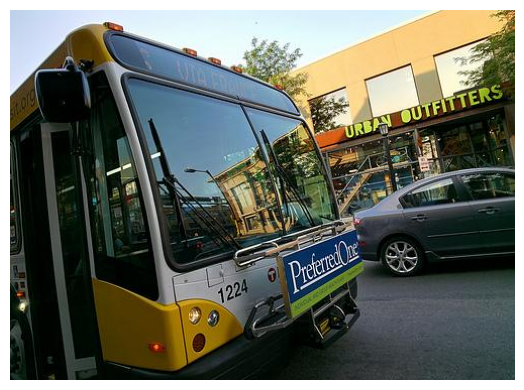


Reference_Caption: A white and yellow public transportation bus with "122" on front is stopped with it's doors open. There is a gray car on the street beside the bus. Behind the car there is a  building with an "Urban Outfitters" on the first floor.

Generated_Caption: In the image we can see there are two buses. The bus on the left side is black and yellow in color and the bus on the right side is grey and black in color. In the background there is a building with some text written on it. There is a car parked on the right side.
-------------------------------------------------
Image: /kaggle/input/dl-dataset/custom_captions_dataset/test/test_6.jpg


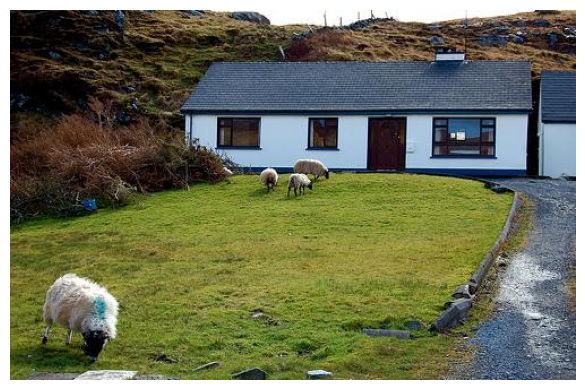


Reference_Caption: A large white house with a brown door sits behind some grass. There are four sheep grazing on the grass in front of the house. The house ahs a gray roof. 

Generated_Caption: In the image we can see there are three sheep grazing on the grass. There is a house in the middle of the image. There is a road in the image. There is a rock in the image. There is a blue color object in the image.
-------------------------------------------------
Image: /kaggle/input/dl-dataset/custom_captions_dataset/test/test_7.jpg


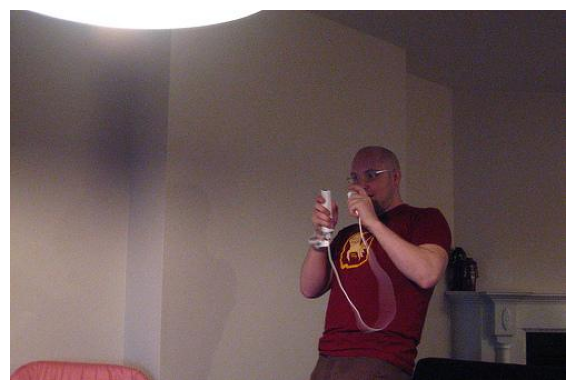


Reference_Caption: A man in a red and yellow t-shirt is holding a Wii remote in each of his hands. Behind him there is a fireplace which has been painted white. In front of him a light which is on and illuminating the room. 

Generated_Caption: In this image, we can see a man holding a wii remote and standing. In the background, we can see a wall, a table, a cupboard, a light, a chair, a sofa, a table, a cupboard, a wall, a door, a window, a curtain, a floor, a floor mat, a floor, a floor lamp, a floor lamp, a floor mat, a floor mat, a floor mat, a floor mat, a floor mat
-------------------------------------------------
Image: /kaggle/input/dl-dataset/custom_captions_dataset/test/test_8.jpg


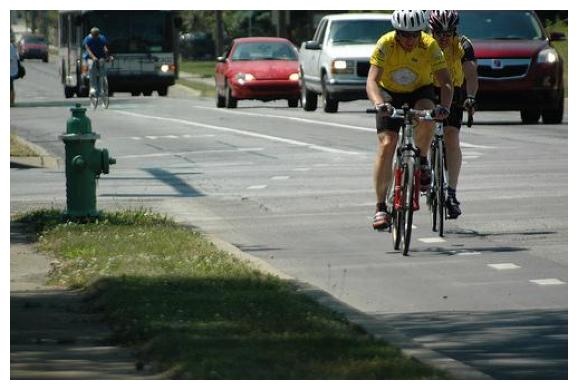


Reference_Caption: There are three men riding bicycles. Two of the men are wearing yellow and the third man has a blue shirt. The two men are way ahead of the third man. The men are bicycling in the bicycle lane. The cars are on the left side of the men.

Generated_Caption: In the image we can see there are two people riding bicycles on the road. The person on the left is wearing yellow color t-shirt and helmet. The person on the right is wearing black color t-shirt and helmet. In the background there are cars, buses, trees, grass, road, and other objects.
-------------------------------------------------
Image: /kaggle/input/dl-dataset/custom_captions_dataset/test/test_9.jpg


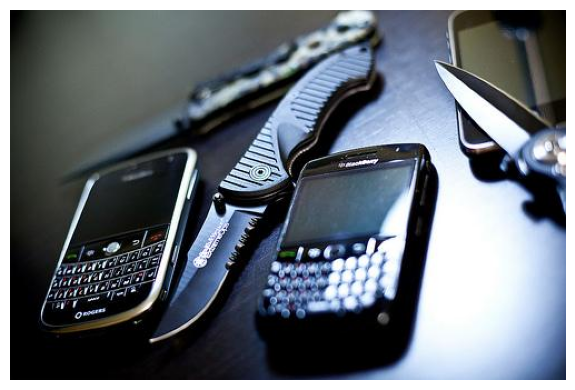


Reference_Caption: TWO CELL PHONES ON THE TABLE.THEY BOTH ARE DARK IN COLOR A ND ARE BLACBERRYS.THERE ARE THREE CUTTING KNIVES.ONE KNIFE IS BETWEEN THE TWO PHONES.THERE IS A THIRD PHONE WITH A KNIFE LYING OVER IT.

Generated_Caption: In the image we can see there are phones, knives, and a few other objects.
-------------------------------------------------
Image: /kaggle/input/dl-dataset/custom_captions_dataset/test/test_10.jpg


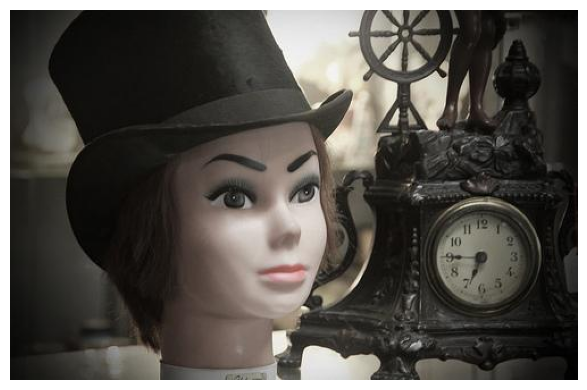


Reference_Caption: A painted mannequin head sits on a table. It is a feminine head with arched eyebrows a small nose, big eyes and it is wearing a black top hat and a brown wig. To the right of the head is a metal sculpture clock with a white face.

Generated_Caption: In this image, we can see a clock and a mannequin. We can also see a hat.
-------------------------------------------------
Image: /kaggle/input/dl-dataset/custom_captions_dataset/test/test_11.jpg

Reference_Caption: A white and yellow train is on the tracks. There is a large yellow door on the front of the train. There is a platform next to the train. 

Generated_Caption: In the image we can see a train on the railway track. The train is in yellow and white color.
-------------------------------------------------
Image: /kaggle/input/dl-dataset/custom_captions_dataset/test/test_12.jpg

Reference_Caption: A man is sitting on the back of an elephant. They are walking through a very high swamp area. They are being seen fro

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image

generated_captions = []
reference_captions = []

for i, (img_path,ref_cap) in enumerate(Test_Data):
    gen_cap = zero_shot_captioning(img_path)
    generated_captions.append(gen_cap)
    reference_captions.append(ref_cap)
    print(f"Image: {img_path}")

    if i<10:
        img = Image.open(img_path)
        plt.figure(figsize=(6, 4))
        plt.imshow(img)
        plt.axis('off')
        plt.tight_layout()
        plt.show()

    print(f"\nReference_Caption: {ref_cap}")
    print(f"\nGenerated_Caption: {gen_cap}")
    print("-------------------------------------------------")

## 📊 Caption Evaluation Metrics

This section evaluates the performance of generated captions using three common NLP metrics: **ROUGE-L**, **METEOR**, and **BLEU**.

---

### 📦 Metric Libraries Used

- `evaluate` (🤗): For computing ROUGE and METEOR.
- `nltk`: For computing BLEU score with smoothing.

---

### 📝 Metric Computation

In [ ]:
import nltk
from nltk.translate.bleu_score import corpus_bleu, SmoothingFunction
from nltk.translate.meteor_score import meteor_score
import evaluate
rouge = evaluate.load("rouge")
meteor = evaluate.load("meteor")
from rouge_score import rouge_scorer

rouge_score_results = []
meteor_score_results = []
bleu_score_results = []

rouge_score_results_custom0 = []
meteor_score_results_custom0 = []
bleu_score_results_custom0 = []

rouge_result = rouge.compute(predictions=generated_captions, references=reference_captions, rouge_types=["rougeL"])
meteor_result = meteor.compute(predictions=generated_captions, references=reference_captions)

bleu_references = [[ref.lower().split()] for ref in reference_captions]
bleu_predictions = [pred.lower().split() for pred in generated_captions]

smooth_fn = SmoothingFunction().method1
bleu_score_value = corpus_bleu(bleu_references, bleu_predictions, smoothing_function=smooth_fn)

print(f"ROUGE-L Score: {rouge_result['rougeL']:.4f}")
print(f"METEOR Score: {meteor_result['meteor']:.4f}")
print(f"BLEU Score: {bleu_score_value:.4f}")

rouge_score_results.append(rouge_result['rougeL'])
meteor_score_results.append(meteor_result['meteor'])
bleu_score_results.append(bleu_score_value)

[nltk_data] Downloading package wordnet to /usr/share/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package punkt_tab to /usr/share/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /usr/share/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


ROUGE-L Score: 0.2200
METEOR Score: 0.1881
BLEU Score: 0.0283


## 🧹 Memory Management and Optimization

This section ensures proper memory management to prevent resource bottlenecks during model inference or training, especially when using large models on GPUs.

---

### 🧑‍💻 Disabling Parallel Tokenizer Threads

In [ ]:
import torch
import gc
import os

os.environ["TOKENIZERS_PARALLELISM"] = "false"
torch.cuda.empty_cache()
gc.collect()

0

## 🧑‍💻 Model Training for Image Captioning

This section contains the complete setup and training pipeline for the **Image Captioning Model** using a **Vision Transformer (ViT)** encoder and a **GPT-2** text decoder.

---

### 1. **Libraries and Hyperparameters**

The following packages are used for training:
- **PyTorch**: For defining and training the model.
- **Transformers**: For pre-trained ViT and GPT-2 models.
- **TQDM**: For progress tracking during training.

Hyperparameters:
- **Learning rate (`lr`)**: `1e-4`
- **Batch size (`batch_size`)**: `16`
- **Epochs**: `50`
- **Maximum sequence length (`max_seq_len`)**: `64`
- **Patience**: `10` (early stopping after 10 epochs without improvement)

---

### 2. **Dataset Preparation**

The **`ImageCaptionDataset`** class handles data loading for training, validation, and testing:
- **Image transformations**: Resizes and normalizes images.
- **Tokenization**: GPT-2 tokenizer truncates and pads captions to the defined maximum sequence length.

---

### 3. **Model Architecture**

The **`ImageCaptionModel`** class consists of:
- **ViT Encoder**: Processes input images.
- **GPT-2 Decoder**: Generates captions based on encoded image features.
- **Bridge Layer**: Maps the ViT outputs to the size required by GPT-2's decoder.

Key Features:
- **Cross-attention** between the encoder (image) and decoder (text).
- **Freezing Parameters**: The model only fine-tunes specific layers for efficiency.

---

### 4. **Training Loop**

The **`train_model`** function executes the following steps:
1. **Training Phase**:
   - Forward pass through the model.
   - Loss computation and optimization using **AdamW**.
   - **Gradient scaling** with automatic mixed precision for faster training on GPUs.
   
2. **Validation Phase**:
   - Model evaluation on the validation set without gradients.
   
3. **Early Stopping**:
   - If no improvement in validation loss for `patience` epochs, training stops early to prevent overfitting.

Progress tracking is done via **TQDM**, and model checkpoints are saved if validation loss improves.

---

### 5. **Training Execution**

The model is trained with the following steps:
- Initialize model and optimizer.
- Call the `train_model` function with the training settings.


In [ ]:
# Install if missing
num_of_images = None

# Batch size might need to be reduced if you run out of GPU memory.


import torch
from torch import nn
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms
from PIL import Image
from transformers import (ViTModel, GPT2Tokenizer, GPT2LMHeadModel,ViTImageProcessor, get_cosine_schedule_with_warmup, GPT2Config)
from torch.optim import AdamW
from tqdm import tqdm
import os


vit_model_name = "google/vit-base-patch16-224"
gpt2_model_name = "gpt2"
img_size = 224
batch_size = 16
lr = 1e-4
num_epochs = 50
max_seq_len = 64
patience = 10

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


# 2. Dataset
class ImageCaptionDataset(Dataset):
    def __init__(self, data, feature_extractor, tokenizer):
        self.data = data  # list of (image_path, caption)
        self.feature_extractor = feature_extractor
        self.tokenizer = tokenizer
        self.transform = transforms.Compose([
            transforms.Resize((img_size, img_size)),
            transforms.ToTensor(),
            transforms.Normalize(mean=self.feature_extractor.image_mean,
                                 std=self.feature_extractor.image_std)
        ])

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        img_path, caption = self.data[idx]
        image = Image.open(img_path).convert("RGB")
        image = self.transform(image)

        tokens = self.tokenizer(caption, truncation=True, padding="max_length",
                                max_length=max_seq_len, return_tensors="pt")

        return {
            "pixel_values": image,
            "input_ids": tokens.input_ids.squeeze(0),
            "attention_mask": tokens.attention_mask.squeeze(0)
        }

# 3. Model
class ImageCaptionModel(nn.Module):
    def __init__(self):
        super().__init__()

        self.vision_encoder = ViTModel.from_pretrained(vit_model_name)

        decoder_cfg = GPT2Config.from_pretrained(gpt2_model_name)
        decoder_cfg.add_cross_attention = True
        decoder_cfg.is_decoder = True

        self.text_decoder = GPT2LMHeadModel.from_pretrained(gpt2_model_name, config=decoder_cfg)

        self.tokenizer = GPT2Tokenizer.from_pretrained(gpt2_model_name)
        self.tokenizer.pad_token = self.tokenizer.eos_token
        self.text_decoder.resize_token_embeddings(len(self.tokenizer))
        self.text_decoder.config.pad_token_id = self.tokenizer.pad_token_id

        self.bridge = nn.Linear(self.vision_encoder.config.hidden_size, self.text_decoder.config.n_embd)

        for name, param in self.vision_encoder.named_parameters():
            param.requires_grad = 'norm' in name.lower()
        for name, param in self.text_decoder.named_parameters():
            param.requires_grad = any(key in name.lower() for key in ['crossattention', 'ln', 'layernorm'])
        for param in self.bridge.parameters():
            param.requires_grad = True

    def forward(self, pixel_values, input_ids, attention_mask):
        # Compute image representations from the encoder
        encoder_outputs = self.vision_encoder(pixel_values=pixel_values)
        encoder_hidden_states = encoder_outputs.last_hidden_state
        # Map the encoder outputs to match decoder's expected hidden size
        encoder_projection = self.bridge(encoder_hidden_states)

        # Pass encoder hidden states to the decoder
        outputs = self.text_decoder(
            input_ids=input_ids,
            attention_mask=attention_mask,
            encoder_hidden_states=encoder_projection,
            encoder_attention_mask=torch.ones(encoder_hidden_states.size()[:-1], device=encoder_hidden_states.device),
            labels=input_ids,
            use_cache=False
        )
        return outputs

# 4. Prepare Datasets // test dataset is already prepped

def train_model(model: nn.Module, optimizer, criterion, device: str, epochs: int):

    best_val_loss = float('inf')
    patience_counter = 0

    # Prepare the datasets and dataloaders
    train_loader = DatasetLoader("train", num_of_images)
    train_data = train_loader.get_data()

    val_loader = DatasetLoader("val", num_of_images)
    val_data = val_loader.get_data()

    feature_extractor = ViTImageProcessor.from_pretrained(vit_model_name)
    tokenizer = GPT2Tokenizer.from_pretrained(gpt2_model_name)
    tokenizer.pad_token = tokenizer.eos_token

    train_dataset = ImageCaptionDataset(train_data, feature_extractor, tokenizer)
    val_dataset = ImageCaptionDataset(val_data, feature_extractor, tokenizer)
    test_dataset = ImageCaptionDataset(Test_Data, feature_extractor, tokenizer)

    train_dataloader = DataLoader(train_dataset, batch_size, shuffle=True, num_workers=4)
    val_dataloader = DataLoader(val_dataset, batch_size, shuffle=False, num_workers=4)
    test_dataloader = DataLoader(test_dataset, batch_size, shuffle=True, num_workers=4)

    model = model.to(device)
    scaler = torch.amp.GradScaler('cuda')
    scheduler = get_cosine_schedule_with_warmup(
        optimizer,
        num_warmup_steps=100,
        num_training_steps=len(train_dataloader) * epochs
    )

    # Start training loop
    for epoch in range(epochs):
        model.train()
        train_loss = 0.0
        progress_bar = tqdm(train_dataloader, leave=False, desc=f"Epoch {epoch+1} Training Progress")

        for batch in progress_bar:
            pixel_values = batch["pixel_values"].to(device)
            input_ids = batch["input_ids"].to(device)
            attention_mask = batch["attention_mask"].to(device)

            optimizer.zero_grad()

            with torch.amp.autocast('cuda'):
                outputs = model(pixel_values, input_ids, attention_mask)
                loss = outputs.loss

            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()
            scheduler.step()

            train_loss += loss.item()
            # Updating progress bar with a different style message.
            progress_bar.set_postfix_str(f"Loss: {loss.item():.4f}")

        avg_train_loss = train_loss / len(train_dataloader)

        # Validation Loop
        model.eval()
        val_loss = 0.0
        with torch.no_grad():
            for batch in val_dataloader:
                pixel_values = batch["pixel_values"].to(device)
                input_ids = batch["input_ids"].to(device)
                attention_mask = batch["attention_mask"].to(device)

                with torch.amp.autocast('cuda'):
                    outputs = model(pixel_values, input_ids, attention_mask)
                    loss = outputs.loss
                val_loss += loss.item()

        avg_val_loss = val_loss / len(val_dataloader)

        # New style of printing the epoch summary
        print("=" * 50)
        print(f"Epoch {epoch+1} Summary")
        print(f"    Training Loss : {avg_train_loss:.4f}")
        print(f"    Validation Loss: {avg_val_loss:.4f}")

        # Check for improvement and early stopping conditions
        if avg_val_loss < best_val_loss:
            best_val_loss = avg_val_loss
            torch.save(model.state_dict(), "best_vit_gpt2_image_captioning.pth")
            print(f"--> Model improved! Saved best model at epoch {epoch+1}.")
            patience_counter = 0
        else:
            patience_counter += 1
            print(f"--> No improvement at epoch {epoch+1} (Patience: {patience_counter}/{patience}).")

        if patience_counter >= patience:
            print("-" * 50)
            print(f"Stopping early: No improvement for {patience} epochs. Training halted at epoch {epoch+1}.")
            break

    print("Training complete!")



# 5. Training
model = ImageCaptionModel()
optimizer = torch.optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=5e-5)
train_model(model, optimizer, None, "cuda", 100)




config.json:   0%|          | 0.00/69.7k [00:00<?, ?B/s]

Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`


model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

Some weights of ViTModel were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly initialized: ['pooler.dense.bias', 'pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


config.json:   0%|          | 0.00/665 [00:00<?, ?B/s]

Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`


model.safetensors:   0%|          | 0.00/548M [00:00<?, ?B/s]

Some weights of GPT2LMHeadModel were not initialized from the model checkpoint at gpt2 and are newly initialized: ['transformer.h.0.crossattention.c_attn.bias', 'transformer.h.0.crossattention.c_attn.weight', 'transformer.h.0.crossattention.c_proj.bias', 'transformer.h.0.crossattention.c_proj.weight', 'transformer.h.0.crossattention.q_attn.bias', 'transformer.h.0.crossattention.q_attn.weight', 'transformer.h.0.ln_cross_attn.bias', 'transformer.h.0.ln_cross_attn.weight', 'transformer.h.1.crossattention.c_attn.bias', 'transformer.h.1.crossattention.c_attn.weight', 'transformer.h.1.crossattention.c_proj.bias', 'transformer.h.1.crossattention.c_proj.weight', 'transformer.h.1.crossattention.q_attn.bias', 'transformer.h.1.crossattention.q_attn.weight', 'transformer.h.1.ln_cross_attn.bias', 'transformer.h.1.ln_cross_attn.weight', 'transformer.h.10.crossattention.c_attn.bias', 'transformer.h.10.crossattention.c_attn.weight', 'transformer.h.10.crossattention.c_proj.bias', 'transformer.h.10.cros

generation_config.json:   0%|          | 0.00/124 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/26.0 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.04M [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/160 [00:00<?, ?B/s]

Epoch 1 Training Progress:   0%|          | 0/358 [00:00<?, ?it/s]`loss_type=None` was set in the config but it is unrecognised.Using the default loss: `ForCausalLMLoss`.


Epoch 1 Summary
    Training Loss : 2.7456
    Validation Loss: 2.3899
--> Model improved! Saved best model at epoch 1.


Epoch 2 Summary
    Training Loss : 2.4057
    Validation Loss: 2.3182
--> Model improved! Saved best model at epoch 2.


Epoch 3 Summary
    Training Loss : 2.3261
    Validation Loss: 2.2646
--> Model improved! Saved best model at epoch 3.


Epoch 4 Summary
    Training Loss : 2.2575
    Validation Loss: 2.2223
--> Model improved! Saved best model at epoch 4.


Epoch 5 Summary
    Training Loss : 2.1979
    Validation Loss: 2.1976
--> Model improved! Saved best model at epoch 5.


Epoch 6 Summary
    Training Loss : 2.1469
    Validation Loss: 2.1800
--> Model improved! Saved best model at epoch 6.


Epoch 7 Summary
    Training Loss : 2.1040
    Validation Loss: 2.1658
--> Model improved! Saved best model at epoch 7.


Epoch 8 Summary
    Training Loss : 2.0626
    Validation Loss: 2.1654
--> Model improved! Saved best model at epoch 8.


Epoch 9 Summary
    Training Loss : 2.0192
    Validation Loss: 2.1637
--> Model improved! Saved best model at epoch 9.


Epoch 10 Summary
    Training Loss : 1.9836
    Validation Loss: 2.1666
--> No improvement at epoch 10 (Patience: 1/10).


Epoch 11 Summary
    Training Loss : 1.9494
    Validation Loss: 2.1683
--> No improvement at epoch 11 (Patience: 2/10).


Epoch 12 Summary
    Training Loss : 1.9105
    Validation Loss: 2.1724
--> No improvement at epoch 12 (Patience: 3/10).


Epoch 13 Summary
    Training Loss : 1.8733
    Validation Loss: 2.1852
--> No improvement at epoch 13 (Patience: 4/10).


Epoch 14 Summary
    Training Loss : 1.8406
    Validation Loss: 2.1978
--> No improvement at epoch 14 (Patience: 5/10).


Epoch 15 Summary
    Training Loss : 1.8047
    Validation Loss: 2.2031
--> No improvement at epoch 15 (Patience: 6/10).


Epoch 16 Summary
    Training Loss : 1.7720
    Validation Loss: 2.2197
--> No improvement at epoch 16 (Patience: 7/10).


Epoch 17 Summary
    Training Loss : 1.7404
    Validation Loss: 2.2370
--> No improvement at epoch 17 (Patience: 8/10).


Epoch 18 Summary
    Training Loss : 1.7053
    Validation Loss: 2.2492
--> No improvement at epoch 18 (Patience: 9/10).


Epoch 19 Summary
    Training Loss : 1.6759
    Validation Loss: 2.2740
--> No improvement at epoch 19 (Patience: 10/10).
--------------------------------------------------
Stopping early: No improvement for 10 epochs. Training halted at epoch 19.
Training complete!


In [ ]:
from transformers import AutoFeatureExtractor, GPT2Tokenizer
import torch
from PIL import Image
import torchvision.transforms as transforms

def gen_caption(model, img_path, tokenizer, feat_extr, max_tokens=100, beams=3):
    model.eval()
    # Load and preprocess image.
    img = Image.open(img_path).convert("RGB")
    preproc = transforms.Compose([
        transforms.Resize((img_size, img_size)),
        transforms.ToTensor(),
        transforms.Normalize(mean=feat_extr.image_mean, std=feat_extr.image_std)
    ])
    pix = preproc(img).unsqueeze(0).to(device)

    with torch.no_grad():
        enc_out = model.vision_encoder(pixel_values=pix).last_hidden_state
        proj = model.bridge(enc_out)
        attn = torch.ones(proj.shape[:-1], device=device)

        # Begin with a single pad token as the decoder's initial input.
        start = torch.tensor([[tokenizer.pad_token_id]], device=device)
        start_mask = torch.ones_like(start)
        gen_ids = model.text_decoder.generate(
            input_ids=start,
            encoder_hidden_states=proj,
            encoder_attention_mask=attn,
            attention_mask = start_mask,
            max_new_tokens=max_tokens,
            num_beams=beams,
            early_stopping=True,
            do_sample=True,
            temperature=0.7,
            top_p=0.9,
            pad_token_id=tokenizer.eos_token_id,
            decoder_start_token_id=tokenizer.eos_token_id
        )

    return tokenizer.decode(gen_ids[0], skip_special_tokens=True)

# Example usage:
feature_extractor = AutoFeatureExtractor.from_pretrained(vit_model_name)
tokenizer = GPT2Tokenizer.from_pretrained(gpt2_model_name)
tokenizer.pad_token = tokenizer.eos_token


/usr/local/lib/python3.11/dist-packages/transformers/models/vit/feature_extraction_vit.py:28: FutureWarning: The class ViTFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use ViTImageProcessor instead.
  warnings.warn(


[nltk_data] Downloading package wordnet to /usr/share/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package punkt_tab to /usr/share/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /usr/share/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


Image: /kaggle/input/dl-dataset/custom_captions_dataset/test/test_1.jpg


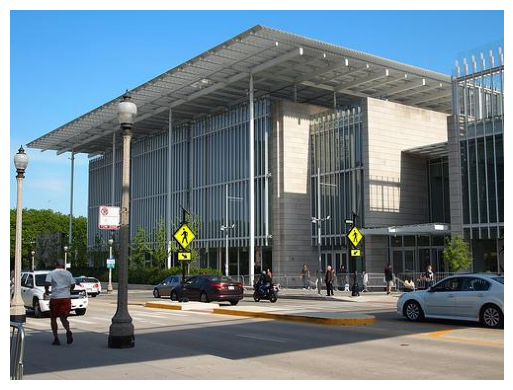

Test Sample : [1]

Reference_Caption: A large building with bars on the windows in front of it. There is people walking in front of the building. There is a street in front of the building with many cars on it. 

Generated_Caption:  is a black and white image of a city street.  The street is made up of many different types of buildings.  There is a black and white clock on the top of the building.  There are many windows on the top of the building.  The sky is blue with white clouds.  There is a black and white truck driving down the street.  The truck is black and white in color.  The truck is sitting on the sidewalk.  The truck has a black and white
-------------------------------------------------
Image: /kaggle/input/dl-dataset/custom_captions_dataset/test/test_2.jpg


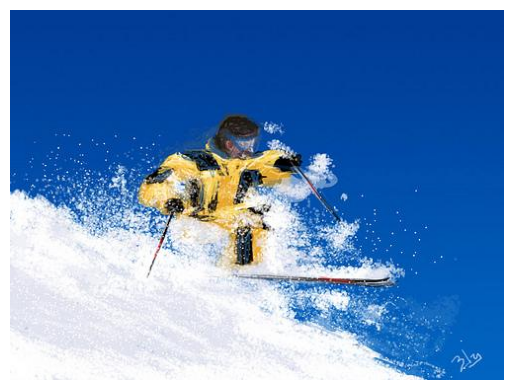

Test Sample : [2]

Reference_Caption: A person is skiing through the snow. There is loose snow all around them from him jumping. The person is wearing a yellow snow suit. The person is holding two ski poles in their hands. 

Generated_Caption:  is an image of a skier. The skier is wearing a red and white helmet. The skier is holding a ski pole. The skier is holding the ski poles in their hands. The snow is white. The skier is holding a ski pole. The skier is holding a ski pole. The skier is holding a ski pole. The skier is holding a ski pole. The skier is holding a ski pole. The skier is holding a ski pole. The
-------------------------------------------------
Image: /kaggle/input/dl-dataset/custom_captions_dataset/test/test_3.jpg


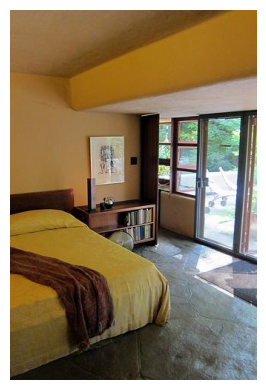

Test Sample : [3]

Reference_Caption: There is a bed in a room against a wall. There is a brown blanket on top of the bed. There is a small brown book shelf next to the bed. There is a picture hanging on the wall above the shelf. 

Generated_Caption:  is a bedroom. there is a white bed in the room. there is a white bed in the room. there is a white lamp in the room. there is a white door in the room. there is a white door in the room.
-------------------------------------------------
Image: /kaggle/input/dl-dataset/custom_captions_dataset/test/test_4.jpg


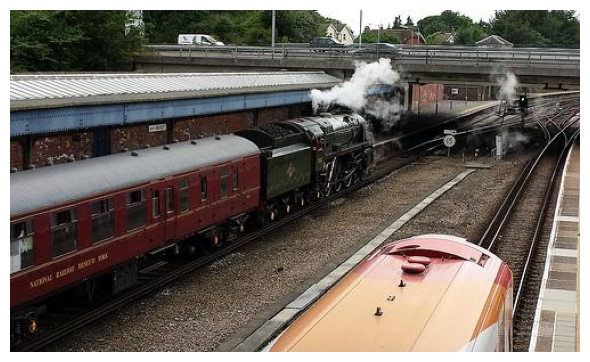

Test Sample : [4]

Reference_Caption: A black and red train is on the tracks and has steam coming out off of it. There is another train next to the first train that is orange. There is an overpass over the train tracks with cars on it. 

Generated_Caption:  is a train on the tracks. The train is red, white and blue. The train is on the tracks. There is a person standing on the platform next to the train. The person is wearing a red jacket and blue jeans. There is a building next to the train. There are trees on the ground next to the train. There is a building next to the train. There is a building next to the train. There is a building next to the train. There is a building next to
-------------------------------------------------
Image: /kaggle/input/dl-dataset/custom_captions_dataset/test/test_5.jpg


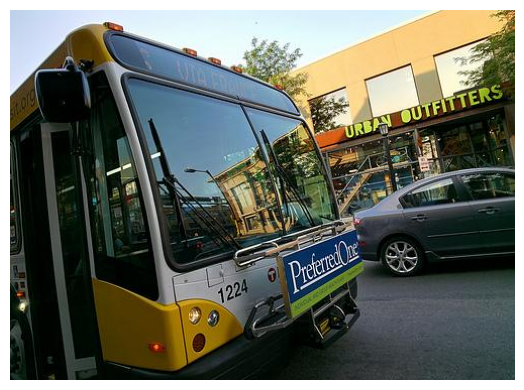

Test Sample : [5]

Reference_Caption: A white and yellow public transportation bus with "122" on front is stopped with it's doors open. There is a gray car on the street beside the bus. Behind the car there is a  building with an "Urban Outfitters" on the first floor.

Generated_Caption:  is an image of a bus. The bus is blue and white in color. The bus is parked on the side of the road. There is a yellow sign on the side of the bus. There is a large building behind the bus. The building is brown. There are many windows on the building. There is a green sign on the side of the bus. There is a green sign on the side of the bus. There is a large building behind the bus. There is a green sign on
-------------------------------------------------
Image: /kaggle/input/dl-dataset/custom_captions_dataset/test/test_6.jpg


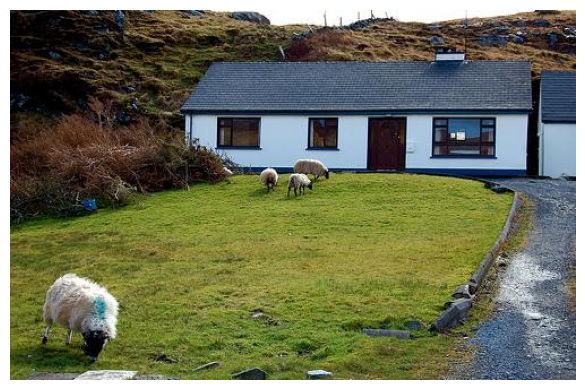

Test Sample : [6]

Reference_Caption: A large white house with a brown door sits behind some grass. There are four sheep grazing on the grass in front of the house. The house ahs a gray roof. 

Generated_Caption:  is an image of a sheep. The sheep is standing on a grassy field. The sheep has a red coat. The grass is green. The sheep is standing on a wooden bench. The bench is made of wood. The bench is made of metal. The wooden bench is white. The house has a porch on it. The house has a porch on it. The house has a porch on it. The house has a porch on it. The house has a porch on it. The house
-------------------------------------------------
Image: /kaggle/input/dl-dataset/custom_captions_dataset/test/test_7.jpg


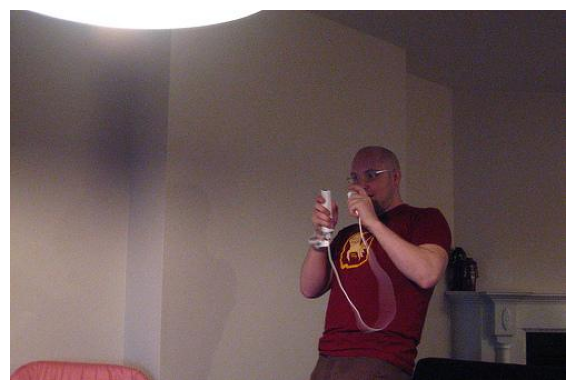

Test Sample : [7]

Reference_Caption: A man in a red and yellow t-shirt is holding a Wii remote in each of his hands. Behind him there is a fireplace which has been painted white. In front of him a light which is on and illuminating the room. 

Generated_Caption:  man is sitting on a couch in front of a white wall. He is wearing a white t-shirt and blue jeans. He is holding a white cell phone in his hand. He is holding up a white game controller in his hand. 
-------------------------------------------------
Image: /kaggle/input/dl-dataset/custom_captions_dataset/test/test_8.jpg


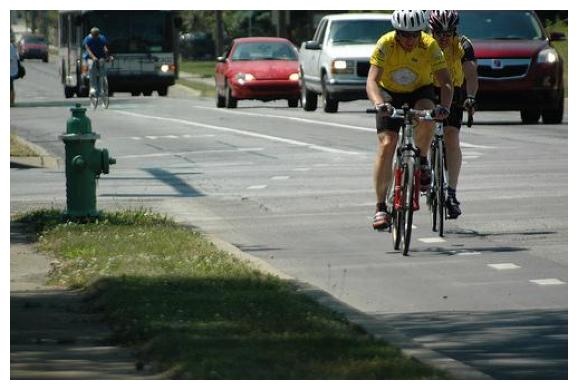

Test Sample : [8]

Reference_Caption: There are three men riding bicycles. Two of the men are wearing yellow and the third man has a blue shirt. The two men are way ahead of the third man. The men are bicycling in the bicycle lane. The cars are on the left side of the men.

Generated_Caption:  is a busy day. There are a lot of people walking down the street. There are a lot of cars on the road. There are a lot of people walking down the street. There are a lot of people walking down the street. There are a lot of lights on the street. There are a lot of cars parked on the street. There are a lot of cars parked on the street. There are a lot of cars parked on the street. There are a lot of cars parked on the
-------------------------------------------------
Image: /kaggle/input/dl-dataset/custom_captions_dataset/test/test_9.jpg


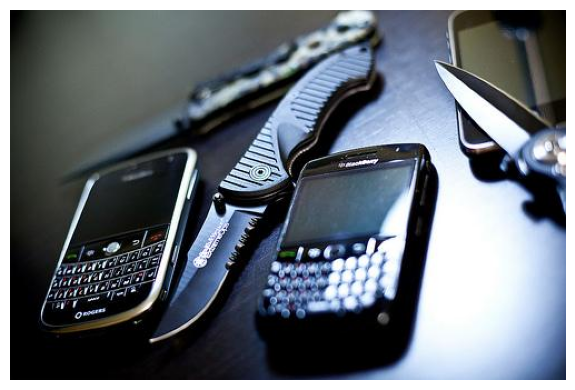

Test Sample : [9]

Reference_Caption: TWO CELL PHONES ON THE TABLE.THEY BOTH ARE DARK IN COLOR A ND ARE BLACBERRYS.THERE ARE THREE CUTTING KNIVES.ONE KNIFE IS BETWEEN THE TWO PHONES.THERE IS A THIRD PHONE WITH A KNIFE LYING OVER IT.

Generated_Caption:  is an image of a cell phone. The cell phone is black and silver. The cell phone is holding a cell phone. The cell phone is black and white. The cell phone is holding a cell phone. The cell phone is black and white. The cell phone has a black and white design. The cell phone has a black and white design. The cell phone has a black and white design. The cell phone has a black and white design. The cell phone has a black and white design.
-------------------------------------------------
Image: /kaggle/input/dl-dataset/custom_captions_dataset/test/test_10.jpg


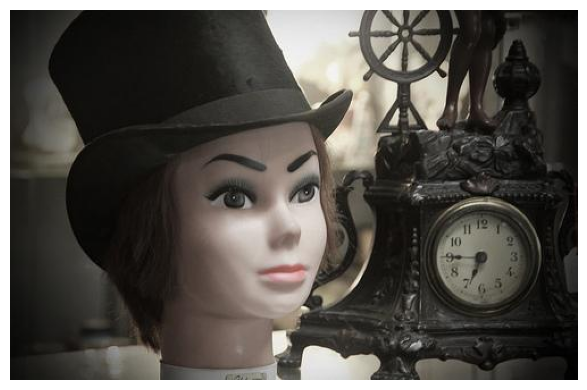

Test Sample : [10]

Reference_Caption: A painted mannequin head sits on a table. It is a feminine head with arched eyebrows a small nose, big eyes and it is wearing a black top hat and a brown wig. To the right of the head is a metal sculpture clock with a white face.

Generated_Caption:  is a picture of a woman. the woman is wearing a black and white dress. the woman is wearing a white shirt. the woman is wearing a black and white dress. the woman is wearing a black and white dress. the woman is wearing a black and white dress. the woman is wearing a black and white dress. the woman is wearing a black and white dress. the woman is wearing a black and white dress. the woman is wearing a black and white dress. the woman is wearing a
-------------------------------------------------
Image: /kaggle/input/dl-dataset/custom_captions_dataset/test/test_11.jpg
Test Sample : [11]

Reference_Caption: A white and yellow train is on the tracks. There is a large yellow door on the front of the trai

{'ROUGE-L': 0.26061802859516403,
 'METEOR': 0.2586382016368183,
 'BLEU': 0.0529784188886012}

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image
import nltk
from nltk.translate.bleu_score import corpus_bleu, SmoothingFunction
from nltk.translate.meteor_score import meteor_score
import evaluate
rouge = evaluate.load("rouge")
meteor = evaluate.load("meteor")
from rouge_score import rouge_scorer

def evaluate_model(model,device):
    generated_captions_custom = []
    reference_captions_custom = []

    for i, (img_path,ref_cap) in enumerate(Test_Data):
        gen_cap = gen_caption(model, img_path, tokenizer, feature_extractor)
        generated_captions_custom.append(gen_cap)
        reference_captions_custom.append(ref_cap)
        print(f"Image: {img_path}")

        if i<10:
            img = Image.open(img_path)
            plt.figure(figsize=(6, 4))
            plt.imshow(img)
            plt.axis('off')
            plt.tight_layout()
            plt.show()

        print(f"Test Sample : [{i+1}]")
        print(f"\nReference_Caption: {ref_cap}")
        print(f"\nGenerated_Caption: {gen_cap}")
        print("-------------------------------------------------")

    rouge_result = rouge.compute(predictions=generated_captions_custom, references=reference_captions_custom, rouge_types=["rougeL"])
    meteor_result = meteor.compute(predictions=generated_captions_custom, references=reference_captions_custom)

    bleu_references = [[ref.lower().split()] for ref in reference_captions_custom]
    bleu_predictions = [pred.lower().split() for pred in generated_captions_custom]

    smooth_fn = SmoothingFunction().method1
    bleu_score_value = corpus_bleu(bleu_references, bleu_predictions, smoothing_function=smooth_fn)

    print(f"ROUGE-L Score: {rouge_result['rougeL']:.4f}")
    print(f"METEOR Score: {meteor_result['meteor']:.4f}")
    print(f"BLEU Score: {bleu_score_value:.4f}")

    result = {
        "ROUGE-L":rouge_result['rougeL'],
        "METEOR": meteor_result['meteor'],
        "BLEU": bleu_score_value
    }

    rouge_score_results_custom0.append(rouge_result['rougeL'])
    meteor_score_results_custom0.append(meteor_result['meteor'])
    bleu_score_results_custom0.append(bleu_score_value)

    return result

evaluate_model(model,device)

# PART B
## Image Occlusion & Captioning Pipeline 📸📝

This notebook showcases a pipeline for occluding images and generating captions through both zero-shot and custom models. Key sections include:

- **Imports & Constants:** Loads necessary libraries (PIL, NumPy, Torch, etc.), sets the compute device, and defines occlusion levels.
- **Image Occlusion:** Implements `occlude_image` to randomly mask image patches based on a given percentage.
- **Caption Generation:**
  - Uses a zero-shot approach with `zero_shot_captioning_occluded` that crafts prompts for captioning.
  - Implements `gen_caption_occluded` to generate captions with a custom model, including pre-processing and decoding techniques.
- **Evaluation:** Evaluates generated captions against references using metrics like ROUGE, METEOR, and BLEU, and logs the results to a CSV file.
- **Execution Flow:** Iterates through occlusion levels and prints detailed evaluation results for both captioning methods.



In [ ]:
from PIL import Image
import numpy as np
import os
import csv
import random
import numpy as np
# from PIL import Image
import torch
import torchvision.transforms as transforms

# import numpy as np
# import torch

DEVICE = "cuda:0" if torch.cuda.is_available() else "cpu"
csv_filename="PartB_Data.csv"
occlusion_levels = [10, 50, 80]  # percentage of image to occlude


def occlude_image(img_np: np.ndarray, mask_percentage: int, patch_size: int = 16) -> np.ndarray:
    H, W, C = img_np.shape
    num_patches_h = H // patch_size
    num_patches_w = W // patch_size
    total_patches = num_patches_h * num_patches_w
    num_to_mask = int(total_patches * mask_percentage / 100)

    patch_indices = [(i, j) for i in range(num_patches_h) for j in range(num_patches_w)]
    selected_indices = np.random.choice(len(patch_indices), size=num_to_mask, replace=False)

    for idx in selected_indices:
        i, j = patch_indices[idx]
        y_start = i * patch_size
        x_start = j * patch_size
        img_np[y_start:y_start + patch_size, x_start:x_start + patch_size, :] = 0
    return img_np

# # Example usage:
# feature_extractor = AutoFeatureExtractor.from_pretrained(vit_model_name)
# tokenizer = GPT2Tokenizer.from_pretrained(gpt2_model_name)
# tokenizer.pad_token = tokenizer.eos_token



def zero_shot_captioning_occluded(occluded_img: Image.Image) -> str:

    # Build the chat prompt with image placeholder
    messages = [{
        "role": "user",
        "content": [
            {"type": "image"},
            {"type": "text", "text": "Describe the image in less than 100 words in the form of a caption with some key details of the objects in image"}

        ]
    }]
    prompt = Processor.apply_chat_template(messages, add_generation_prompt=True)

    inputs = Processor(text=prompt, images=occluded_img, return_tensors="pt")
    inputs = {k: v.to(DEVICE) for k, v in inputs.items()}

    # Generate
    generated_ids = Model.generate(
        **inputs,
        max_new_tokens=100,                             # restrict captions to 100 words long
        eos_token_id=Processor.tokenizer.eos_token_id)  # End at stopping point

    generated_texts = Processor.batch_decode(
        generated_ids,
        skip_special_tokens=True,
    )
    caption_generated = generated_texts[0].split("Assistant:")[-1].strip()

    return caption_generated

def gen_caption_occluded(model, occluded_img, tokenizer, feat_extr, occlusion_level, max_tokens=100, beams=3):
    model.eval()

    preproc = transforms.Compose([
        transforms.Resize((img_size, img_size)),
        transforms.ToTensor(),
        transforms.Normalize(mean=feat_extr.image_mean, std=feat_extr.image_std)
    ])
    pix = preproc(occluded_img).unsqueeze(0).to(DEVICE)

    with torch.no_grad():
        enc_out = model.vision_encoder(pixel_values=pix).last_hidden_state
        proj = model.bridge(enc_out)
        attn = torch.ones(proj.shape[:-1], device=DEVICE)

        # Begin with a single pad token as the decoder's initial input.
        start = torch.tensor([[tokenizer.pad_token_id]], device=DEVICE)
        start_mask = torch.ones_like(start)
        gen_ids = model.text_decoder.generate(
            input_ids=start,
            encoder_hidden_states=proj,
            encoder_attention_mask=attn,
            attention_mask = start_mask,
            max_new_tokens=max_tokens,
            num_beams=beams,
            early_stopping=True,
            do_sample=True,
            temperature=0.7,
            top_p=0.9,
            pad_token_id=tokenizer.eos_token_id,
            decoder_start_token_id=tokenizer.eos_token_id
        )

    return tokenizer.decode(gen_ids[0], skip_special_tokens=True)

# # Example usage:
# feature_extractor = AutoFeatureExtractor.from_pretrained(vit_model_name)
# tokenizer = GPT2Tokenizer.from_pretrained(gpt2_model_name)
# tokenizer.pad_token = tokenizer.eos_token


# Evaluate model on occluded images
rouge_score_results_smol = []
meteor_score_results_smol = []
bleu_score_results_smol = []

rouge_score_results_custom = []
meteor_score_results_custom = []
bleu_score_results_custom = []

def evaluate_on_occluded_images(model,device=DEVICE,occlusion_levels=occlusion_levels):
    with open(csv_filename, mode="a", newline="", encoding="utf-8") as csv_file:
        writePointer = csv.writer(csv_file)
        writePointer.writerow(["image_id", "original", "smol_caption", "custom_caption", "perturbation"])
        for occlusion_level in occlusion_levels:
            custom_Predictions=[]
            Smol_Predictions=[]
            references=[]
            print()
            print()
            print("Level of Occlusion: ", occlusion_level)
            print()
            print(f"Generating captions for {len(Test_Data)} occluded images with custom model\n")

            for i, (img_path, ref_caption) in enumerate(Test_Data):

                # Load and preprocess image.
                img = Image.open(img_path).convert("RGB")
                img_np = np.array(img)
                occluded_np = occlude_image(img_np, mask_percentage=occlusion_level)
                occluded_img = Image.fromarray(occluded_np.astype(np.uint8))

                pred_custom_caption = gen_caption_occluded(model, occluded_img, tokenizer, feature_extractor, occlusion_level)

                pred_Smol_caption = zero_shot_captioning_occluded(occluded_img)

                # Store results
                Smol_Predictions.append(pred_Smol_caption)
                custom_Predictions.append(pred_custom_caption)
                references.append(ref_caption)
                writePointer.writerow([i, ref_caption, pred_Smol_caption, pred_custom_caption, occlusion_level])

                print(f"Sample test : [{i+1}/{len(Test_Data)}] {os.path.basename(img_path)}")
                print(f"\nReference : {ref_caption}")
                print(f"Generated Caption by SmolVLM :\n {pred_Smol_caption}\n")
                print(f"Generated Caption by Custom Model :\n {pred_custom_caption}\n")
                print("====================================================================================================================")


            rouge_result_smol = rouge.compute(predictions=Smol_Predictions, references=references, rouge_types=["rougeL"])
            rouge_result_custom = rouge.compute(predictions=custom_Predictions, references=references, rouge_types=["rougeL"])

            meteor_result_smol = meteor.compute(predictions=Smol_Predictions, references=references)
            meteor_result_custom = meteor.compute(predictions=custom_Predictions, references=references)

            bleu_references = [[ref.lower().split()] for ref in references]
            bleu_predictions_smol = [pred.lower().split() for pred in Smol_Predictions]
            bleu_predictions_custom = [pred.lower().split() for pred in custom_Predictions]

            smooth_fn = SmoothingFunction().method1
            bleu_score_value_smol = corpus_bleu(bleu_references, bleu_predictions_smol, smoothing_function=smooth_fn)
            bleu_score_value_custom = corpus_bleu(bleu_references, bleu_predictions_custom, smoothing_function=smooth_fn)

            print("\n Evaluation Results for SmolVLM Model:")
            print(f"ROUGE-L Score: {rouge_result_smol['rougeL']:.4f}")
            print(f"METEOR Score: {meteor_result_smol['meteor']:.4f}")
            print(f"BLEU Score: {bleu_score_value_smol:.4f}")

            rouge_score_results_smol.append(rouge_result_smol['rougeL'])
            meteor_score_results_smol.append(meteor_result_smol['meteor'])
            bleu_score_results_smol.append(bleu_score_value_smol)

            print("\n Evaluation Results for Custom ImageCaption Model:")
            print(f"ROUGE-L Score: {rouge_result_custom['rougeL']:.4f}")
            print(f"METEOR Score: {meteor_result_custom['meteor']:.4f}")
            print(f"BLEU Score: {bleu_score_value_custom:.4f}")

            rouge_score_results_custom.append(rouge_result_custom['rougeL'])
            meteor_score_results_custom.append(meteor_result_custom['meteor'])
            bleu_score_results_custom.append(bleu_score_value_custom)
        print(f"The results are uploaded in the file named {csv_filename}")

        return {
            "BLEU-CUSTOM":bleu_score_results_custom,
            "ROUGE-L-CUSTOM":rouge_score_results_custom,
            "METEOR-CUSTOM":meteor_score_results_custom,
            "BLEU-SMOL":bleu_score_results_smol,
            "ROUGE-L-SMOL":rouge_score_results_smol,
            "METEOR-SMOL":meteor_score_results_smol
        }

evaluate_on_occluded_images(model)



Level of Occlusion:  10

Generating captions for 928 occluded images with custom model

Sample test : [1/928] test_1.jpg

Reference : A large building with bars on the windows in front of it. There is people walking in front of the building. There is a street in front of the building with many cars on it. 
Generated Caption by SmolVLM :
 In the image we can see a building with many windows and a roof. We can also see a street light, a pole, a board with some text and a few people walking on the road. We can also see some vehicles on the road. We can also see some boards with text and numbers. We can also see some plants and trees. We can also see the sky which is in blue color.

Generated Caption by Custom Model :
  is a black and white photo of a black and white traffic cone. The cone has a white flag on it. There is a black and white flag on the top of the cone. There is a black and white flag on the top of the cone. There are people walking on the sidewalk near the traffic cone. T

{'BLEU-CUSTOM': [0.037960648099370456,
  0.01838054319423802,
  0.013607621720213542],
 'ROUGE-L-CUSTOM': [0.24231236134258688,
  0.1916111657877373,
  0.19490039688924027],
 'METEOR-CUSTOM': [0.2389736867293576,
  0.17884292871585372,
  0.17718286505428651],
 'BLEU-SMOL': [0.01608840066833519,
  0.0065260557658677505,
  0.0017926301915697975],
 'ROUGE-L-SMOL': [0.19673540526026156,
  0.1582986834651477,
  0.10275188566027171],
 'METEOR-SMOL': [0.15854144837938747, 0.11380899344990979, 0.0748294312286548]}

In [ ]:
from IPython.display import display, HTML

html_table = """
<h3>Metrics for Different Levels of Occlusions</h3>
<p><em>*Changes are calculated with respect to 0% occlusion with the same model</em></p>
<table border="1" style="border-collapse: collapse; text-align: center;">
    <thead>
        <tr>
            <th rowspan="2">Model</th>
            <th rowspan="2">Occlusion Level</th>
            <th colspan="2">BLEU score</th>
            <th colspan="2">ROUGE-L score</th>
            <th colspan="2">METEOR score</th>
        </tr>
        <tr>
            <th>Score</th>
            <th>Change</th>
            <th>Score</th>
            <th>Change</th>
            <th>Score</th>
            <th>Change</th>
        </tr>
    </thead>
    <tbody>
        <!-- SmolVLM Model -->
        <tr>
            <td rowspan="4">SmolVLM</td>
            <td>0%</td>
            <td>{:.4f}</td><td>{:.4f}</td>
            <td>{:.4f}</td><td>{:.4f}</td>
            <td>{:.4f}</td><td>{:.4f}</td>
        </tr>
        <tr>
            <td>10%</td>
            <td>{:.4f}</td><td>{:+.4f}</td>
            <td>{:.4f}</td><td>{:+.4f}</td>
            <td>{:.4f}</td><td>{:+.4f}</td>
        </tr>
        <tr>
            <td>50%</td>
            <td>{:.4f}</td><td>{:+.4f}</td>
            <td>{:.4f}</td><td>{:+.4f}</td>
            <td>{:.4f}</td><td>{:+.4f}</td>
        </tr>
        <tr>
            <td>80%</td>
            <td>{:.4f}</td><td>{:+.4f}</td>
            <td>{:.4f}</td><td>{:+.4f}</td>
            <td>{:.4f}</td><td>{:+.4f}</td>
        </tr>
        <!-- Custom Model -->
        <tr>
            <td rowspan="4">Custom</td>
            <td>0%</td>
            <td>{:.4f}</td><td>{:.4f}</td>
            <td>{:.4f}</td><td>{:.4f}</td>
            <td>{:.4f}</td><td>{:.4f}</td>
        </tr>
        <tr>
            <td>10%</td>
            <td>{:.4f}</td><td>{:+.4f}</td>
            <td>{:.4f}</td><td>{:+.4f}</td>
            <td>{:.4f}</td><td>{:+.4f}</td>
        </tr>
        <tr>
            <td>50%</td>
            <td>{:.4f}</td><td>{:+.4f}</td>
            <td>{:.4f}</td><td>{:+.4f}</td>
            <td>{:.4f}</td><td>{:+.4f}</td>
        </tr>
        <tr>
            <td>80%</td>
            <td>{:.4f}</td><td>{:+.4f}</td>
            <td>{:.4f}</td><td>{:+.4f}</td>
            <td>{:.4f}</td><td>{:+.4f}</td>
        </tr>
    </tbody>
</table>
""".format(
    # SmolVLM - BLEU, ROUGE, METEOR
    bleu_score_results[0], 0.0, rouge_score_results[0], 0.0, meteor_score_results[0], 0.0,
    bleu_score_results_smol[0], bleu_score_results_smol[0] - bleu_score_results[0],
    rouge_score_results_smol[0], rouge_score_results_smol[0] - rouge_score_results[0],
    meteor_score_results_smol[0], meteor_score_results_smol[0] - meteor_score_results[0],
    bleu_score_results_smol[1], bleu_score_results_smol[1] - bleu_score_results[0],
    rouge_score_results_smol[1], rouge_score_results_smol[1] - rouge_score_results[0],
    meteor_score_results_smol[1], meteor_score_results_smol[1] - meteor_score_results[0],
    bleu_score_results_smol[2], bleu_score_results_smol[2] - bleu_score_results[0],
    rouge_score_results_smol[2], rouge_score_results_smol[2] - rouge_score_results[0],
    meteor_score_results_smol[2], meteor_score_results_smol[2] - meteor_score_results[0],
    # bleu_score_results_smol[3], bleu_score_results_smol[3] - bleu_score_results_smol[0],
    # rouge_score_results_smol[3], rouge_score_results_smol[3] - rouge_score_results_smol[0],
    # meteor_score_results_smol[3], meteor_score_results_smol[3] - meteor_score_results_smol[0],

    # Custom - BLEU, ROUGE, METEOR
    bleu_score_results_custom0[0], 0.0, rouge_score_results_custom0[0], 0.0, meteor_score_results_custom0[0], 0.0,
    bleu_score_results_custom[0], bleu_score_results_custom[0] - bleu_score_results_custom0[0],
    rouge_score_results_custom[0], rouge_score_results_custom[0] - rouge_score_results_custom0[0],
    meteor_score_results_custom[0], meteor_score_results_custom[0] - meteor_score_results_custom0[0],
    bleu_score_results_custom[1], bleu_score_results_custom[1] - bleu_score_results_custom0[0],
    rouge_score_results_custom[1], rouge_score_results_custom[1] - rouge_score_results_custom0[0],
    meteor_score_results_custom[1], meteor_score_results_custom[1] - meteor_score_results_custom0[0],
    bleu_score_results_custom[2], bleu_score_results_custom[2] - bleu_score_results_custom0[0],
    rouge_score_results_custom[2], rouge_score_results_custom[2] - rouge_score_results_custom0[0],
    meteor_score_results_custom[2], meteor_score_results_custom[2] - meteor_score_results_custom0[0],
    # bleu_score_results_custom[3], bleu_score_results_custom[3] - bleu_score_results_custom[0],
    # rouge_score_results_custom[3], rouge_score_results_custom[3] - rouge_score_results_custom[0],
    # meteor_score_results_custom[3], meteor_score_results_custom[3] - meteor_score_results_custom[0],
)

display(HTML(html_table))

# PART C
# Python Notebook Overview: Caption Classifier with BERT

This notebook demonstrates a complete pipeline for building, training, and evaluating a text classification model using BERT. The key components include:

- **Core Imports:** Imports essential libraries for data handling (pandas, numpy), machine learning (scikit-learn), deep learning (PyTorch), and transformer models (BERT via HuggingFace).
- **Dataset Handler:** Defines a custom dataset class (`CaptionDataset`) that tokenizes input text and prepares the data for training and inference.
- **Caption Classifier:** Implements a neural network model (`CaptionClassifier`) that leverages a pre-trained BERT model and a dropout-regularized fully connected layer for classification.
- **Model Trainer:** Contains the training loop (`train_classifier`) that iterates over the data, calculates loss, and updates the model weights.
- **Model Evaluator:** Implements an evaluation function (`evaluate_classifier`) to compute performance metrics such as loss, accuracy, precision, recall, and F1-score.
- **Data Preparation Pipeline:** Processes raw data to create a unified DataFrame, splits it into training, validation, and testing sets, and prepares samples for model input.
- **Execution Flow:** Orchestrates the entire workflow from data preparation and model initialization to training and final evaluation.



In [ ]:
# Core Imports
import pandas as pd
import numpy as np
from sklearn import model_selection as sk_sel
from sklearn.metrics import precision_score as ps, recall_score as rs, f1_score as f1s
import torch
from torch.utils.data import Dataset as TorchDataset, DataLoader as TorchDataLoader
from torch import nn as neural_net, optim as torch_opt
from transformers import BertTokenizer as BertTok, BertModel as BertBase
from torch.optim import AdamW as OptAdamW

# Dataset Handler
class CaptionDataset(TorchDataset):
    def __init__(self, text_data, targets, text_tokenizer, length_limit):
        self.text_samples = text_data
        self.target_labels = targets
        self.tokenizer = text_tokenizer
        self.max_len = length_limit

    def __len__(self):
        return len(self.text_samples)

    def __getitem__(self, index):
        sentence = self.text_samples[index]
        target = self.target_labels[index]

        encoded_data = self.tokenizer.encode_plus(
            text=sentence,
            truncation=True,
            padding='max_length',
            add_special_tokens=True,
            max_length=self.max_len,
            return_attention_mask=True,
            return_tensors='pt'
        )

        return {
            'input_ids': encoded_data['input_ids'].squeeze(0),
            'attention_mask': encoded_data['attention_mask'].flatten(),
            'label': torch.tensor(target, dtype=torch.long)
        }


class CaptionClassifier(neural_net.Module):
    def __init__(self, num_classes):
        super().__init__()
        self.bert_core = BertBase.from_pretrained('bert-base-uncased')
        self.regularization = neural_net.Dropout(0.3)
        self.fc_layer = neural_net.Linear(
            self.bert_core.config.hidden_size,
            num_classes
        )

    def forward(self, token_ids, attention_masks):
        bert_outputs = self.bert_core(
            input_ids=token_ids,
            attention_mask=attention_masks
        )
        pooled_features = bert_outputs.pooler_output
        normalized_output = self.regularization(pooled_features)
        return self.fc_layer(normalized_output)

# Model Trainer
def train_classifier(network, data_loader, optimizer, loss_fn, compute_device, total_epochs):
    network.train()
    for current_epoch in range(total_epochs):
        cumulative_loss = 0.0
        correct_count = 0

        for batch in data_loader:
            optimizer.zero_grad()

            input_vectors = batch['input_ids'].to(compute_device)
            mask_vectors = batch['attention_mask'].to(compute_device)
            truth_labels = batch['label'].to(compute_device)

            predictions = network(input_vectors, mask_vectors)
            loss_value = loss_fn(predictions, truth_labels)
            loss_value.backward()
            optimizer.step()

            cumulative_loss += loss_value.item()
            _, predicted_labels = torch.max(predictions, 1)
            correct_count += (predicted_labels == truth_labels).sum().item()

        epoch_accuracy = correct_count / len(data_loader.dataset)
        print(f'Epoch [{current_epoch+1}/{total_epochs}]'
              f' | Loss: {cumulative_loss/len(data_loader):.3f}'
              f' | Accuracy: {epoch_accuracy:.3f}')

# Model Evaluator
def evaluate_classifier(model, loader, criterion, device):
    model.eval()
    val_loss = 0.0
    correct = 0
    predictions_list = []
    labels_list = []

    with torch.no_grad():
        for data_batch in loader:
            ids = data_batch['input_ids'].to(device)
            masks = data_batch['attention_mask'].to(device)
            y_true = data_batch['label'].to(device)

            y_pred = model(ids, masks)
            loss = criterion(y_pred, y_true)

            val_loss += loss.item()
            _, predicted = torch.max(y_pred, 1)
            correct += (predicted == y_true).sum().item()

            predictions_list.extend(predicted.cpu().numpy())
            labels_list.extend(y_true.cpu().numpy())

    results = {
        'loss': val_loss / len(loader),
        'accuracy': correct / len(loader.dataset),
        'precision': ps(labels_list, predictions_list, average='macro'),
        'recall': rs(labels_list, predictions_list, average='macro'),
        'f1': f1s(labels_list, predictions_list, average='macro')
    }
    return results

# Data Preparation Pipeline
def prepare_datasets():
    raw_data = pd.read_csv('/kaggle/working/PartB_Data.csv')
    processed_samples = []

    for _, record in raw_data.iterrows():
        processed_samples.extend([
            {
                'text': f"{record['original']} <SEP> {record['smol_caption']} <SEP> {record['perturbation']}",
                'label': 0,
                'image_id': record['image_id']
            },
            {
                'text': f"{record['original']} <SEP> {record['custom_caption']} <SEP> {record['perturbation']}",
                'label': 1,
                'image_id': record['image_id']
            }
        ])

    full_df = pd.DataFrame(processed_samples)
    unique_ids = full_df['image_id'].unique()

    train_val_ids, test_ids = sk_sel.train_test_split(
        unique_ids, test_size=0.2, random_state=42
    )
    train_ids, val_ids = sk_sel.train_test_split(
        train_val_ids, test_size=0.125, random_state=42
    )

    full_df['split'] = full_df['image_id'].apply(
        lambda x: 'train' if x in train_ids else 'val' if x in val_ids else 'test'
    )

    return (
        full_df[full_df['split'] == 'train'],
        full_df[full_df['split'] == 'val'],
        full_df[full_df['split'] == 'test']
    )

# Execution Flow
if __name__ == "__main__":
    # Data Preparation
    train_data, val_data, test_data = prepare_datasets()

    # Tokenization Setup
    text_tokenizer = BertTok.from_pretrained('bert-base-uncased')
    MAX_SEQ_LENGTH = 128
    BATCH_SIZE = 16

    # Create Data Loaders
    train_loader = TorchDataLoader(
        CaptionDataset(
            train_data['text'].tolist(),
            train_data['label'].tolist(),
            text_tokenizer,
            MAX_SEQ_LENGTH
        ),
        batch_size=BATCH_SIZE,
        shuffle=True
    )

    test_loader = TorchDataLoader(
        CaptionDataset(
            test_data['text'].tolist(),
            test_data['label'].tolist(),
            text_tokenizer,
            MAX_SEQ_LENGTH
        ),
        batch_size=BATCH_SIZE,
        shuffle=False
    )

    # Model Configuration
    compute_device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    classification_model = CaptionClassifier(num_classes=2).to(compute_device)

    model_optimizer = OptAdamW(classification_model.parameters(), lr=2e-5)
    loss_function = neural_net.CrossEntropyLoss()

    # Training Phase
    train_classifier(
        network=classification_model,
        data_loader=train_loader,
        optimizer=model_optimizer,
        loss_fn=loss_function,
        compute_device=compute_device,
        total_epochs=3
    )

    # Evaluation Phase
    evaluation_results = evaluate_classifier(
        classification_model,
        test_loader,
        loss_function,
        compute_device
    )

    print("\nFinal Evaluation Metrics:")
    for metric, value in evaluation_results.items():
        print(f"{metric.capitalize()}: {value:.3f}")

tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`


model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

Epoch [1/3] | Loss: 0.126 | Accuracy: 0.943
Epoch [2/3] | Loss: 0.046 | Accuracy: 0.976
Epoch [3/3] | Loss: 0.038 | Accuracy: 0.976

Final Evaluation Metrics:
Loss: 0.023
Accuracy: 0.984
Precision: 0.984
Recall: 0.984
F1: 0.984
